# Aprendizaje de Máquina sobre el Impacto del Cambio en el Uso del Suelo sobre la Biodiversidad y el Bienestar
### Daniel Acosta Imandt 
### Gabriel Ernesto Garcia Peña

Estamos interesados en analizar el cambio de la temperatura a lo largo del tiempo y de regiones geográficas, por lo que se esta haciendo una pequeña investigación sobre estos temas, los datos fueron recopilados de The Berkeley Earth temperature reconstruction, el cual tiene la temperatura de varios puntos de la tierra desde  finales del siglo XIX

Cargamos las librerías

In [1]:
import numpy as np
import xarray as xr
import cf_xarray as cfxr
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import cartopy.feature as cfeature
from scipy.interpolate import griddata
import regionmask
import pandas as pd
import seaborn as sns
from pydmd import DMD, BOPDMD
from pydmd.plotter import plot_eigs, plot_summary
from pydmd.preprocessing import hankel_preprocessing
from sklearn.preprocessing import StandardScaler
import math

abrimos los datos y hacemos transformaciones de su estructura para onvertirlos a un df

In [2]:

fN = ("Datos\Land_and_Ocean_EqualArea.nc") 

ds = xr.open_dataset(fN)
years_approx = np.floor(ds['time'])
temp = ds['temperature'].groupby(years_approx).mean('time')
ds

<xarray.Dataset> Size: 135MB
Dimensions:      (map_points: 15984, time: 2089, month_number: 12)
Coordinates:
    longitude    (map_points) float32 64kB ...
    latitude     (map_points) float32 64kB ...
  * time         (time) float64 17kB 1.85e+03 1.85e+03 ... 2.024e+03 2.024e+03
Dimensions without coordinates: map_points, month_number
Data variables:
    land_mask    (map_points) float64 128kB ...
    temperature  (time, map_points) float32 134MB ...
    climatology  (month_number, map_points) float32 767kB ...
Attributes:
    Conventions:           Berkeley Earth Internal Convention (based on CF-1.5)
    title:                 Native Format Berkeley Earth Surface Temperature A...
    history:               20-Feb-2024 09:56:45
    institution:           Berkeley Earth Surface Temperature Project
    land_source_history:   07-Feb-2024 05:19:02
    ocean_source_history:  20-Feb-2024 08:20:00
    comment:               This file contains Berkeley Earth surface temperat...

Tenemos tres coordenadas distintas,dos geográficas(latitud y longitud) y una temporal, las geograficas generan en total una cantidad de 15984 puntos distribuidos alrededor de la Tierra, mientras la temporal tiene fechas desde 1850 hasta 2024, generando en total 2089 epocas.  Las variables de los datos son 
- land_mask: indica si el punto geográfico pertenece a parte de suelo firme o de mar
- Temperature: marca la temperatura en grados celiusus del punto
- Climatology: Air Surface Temperature Climatology (Jan 1951 - Dec 1980)

In [3]:
temp

<xarray.DataArray 'temperature' (time: 175, map_points: 15984)> Size: 11MB
array([[        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       ...,
       [ 1.8083988 ,  1.8333877 ,  1.9705673 , ...,  1.0385882 ,
         0.84548855,  0.9165156 ],
       [ 2.7273686 ,  2.6766558 ,  2.6351082 , ...,  1.1112143 ,
         1.3121489 ,  1.0617033 ],
       [ 2.2762094 ,  2.031323  ,  2.123713  , ..., -1.9515219 ,
        -2.2443862 , -2.2738068 ]], dtype=float32)
Coordinates:
    longitude  (map_points) float32 64kB ...
    latitude   (map_points) float32 64kB ...
  * time       (time) float64 1kB 1.85e+03 1.851e+03 ... 2.023e+03 2.024e+03
Dimensions without coordinates: map_points
Attributes:
    units:          degree C
    standard_name:  surface_temperature_anomaly
    long_name:      Air Surface Temperature Anomaly
    valid_min:      -17.581396970370164
    valid_max:      23.203125874201458

In [4]:
longitude = ds.variables['longitude'][:]  
latitude = ds.variables['latitude'][:]
time = ds.variables['time'][:]
land_mask = ds.variables['land_mask'][:]
temperature = ds.variables['temperature'][:]
climatology = ds.variables['climatology'][:]

In [5]:
# Ajustar el enfoque para la conversión a DataFrame, teniendo cuidado con la estructura de los datos

# Convertir los datos de temperatura a un DataFrame
temperature_df = ds['temperature'].to_dataframe()

# Dado que 'to_dataframe()' convierte todas las dimensiones a índices en el DataFrame,
# necesitamos resetear el índice y luego pivotar el DataFrame si es necesario
temperature_df_reset = temperature_df.reset_index()
temperature_pivot_df = temperature_df_reset.pivot(index='time', columns='map_points', values='temperature')

# Simplificar los nombres de las columnas después de pivotar
temperature_pivot_df.columns = [f"point_{i+1}" for i in range(len(temperature_pivot_df.columns))]

# Revisar el resultado para asegurarse de que tiene el formato correcto
temperature_pivot_df.head()


,point_1,point_2,point_3,point_4,point_5,point_6,point_7,point_8,point_9,point_10,...,point_15975,point_15976,point_15977,point_15978,point_15979,point_15980,point_15981,point_15982,point_15983,point_15984
time,,,,,,,,,,,,,,,,,,,,,
1850.041667,NaN,NaN,NaN,NaN,NaN,NaN,0.464756,0.681552,0.785687,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850.125000,NaN,NaN,NaN,NaN,NaN,NaN,-1.490464,-1.236933,-0.806517,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850.208333,NaN,NaN,NaN,NaN,NaN,NaN,-0.157294,-0.230608,-0.166150,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850.291667,NaN,NaN,NaN,NaN,NaN,NaN,-0.139167,-0.058191,-0.072071,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850.375000,NaN,NaN,NaN,NaN,NaN,NaN,-0.878162,-0.964869,-1.003502,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
# Contar los valores vacíos (NaN) por fila en el DataFrame
nan_counts_per_row = temperature_pivot_df.isna().sum(axis=1)

# Mostrar los resultados
nan_counts_per_row

time
1850.041667    4404
1850.125000    4281
1850.208333    4285
1850.291667    3957
1850.375000    4083
               ... 
2023.708333       0
2023.791667       0
2023.875000       0
2023.958333       0
2024.041667       0
Length: 2089, dtype: int64

Convertimos los datos de la temperatura a un Dataframe para poder manipularlo de una manera mas sencilla. Notamos que hay varios valores vacios, sobretodo en las primeras mediciones ya que no son tan seguros los datos de lso primeros años.

Vemos las 57 regiones divididas del planeta y agrupamos los puntos del mapa para ada región

<GeoAxesSubplot: >

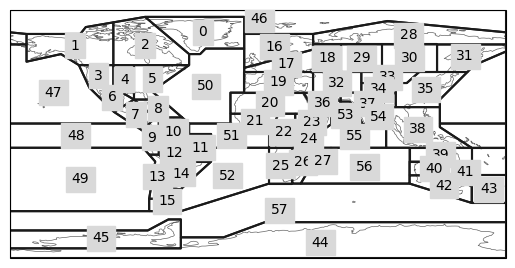

In [7]:

ar6_all = regionmask.defined_regions.ar6.all
ar6_all.plot()

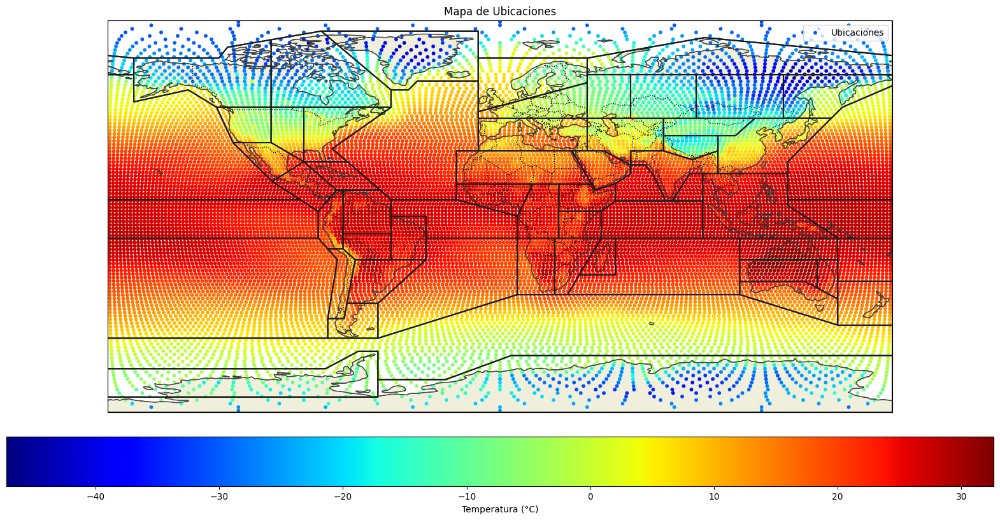

In [8]:
# Crear una figura y un subplot con proyección
fig, ax = plt.subplots(figsize=(20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_global()

# Añadir características al mapa
ax.add_feature(cfeature.LAND)
#ax.add_feature(cfeature.OCEANS)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Añadir los puntos de datos al mapa
scatter =ax.scatter(longitude, latitude,  c=climatology[-1], cmap='jet', s=10, transform=ccrs.Geodetic(), label='Ubicaciones')
cbar = plt.colorbar(scatter, ax=ax, orientation='horizontal', pad=0.05)
cbar.set_label('Temperatura (°C)')

ar6_all.plot(ax=ax, add_label=False)
# Añadir leyenda y título
ax.legend()
ax.set_title('Mapa de Ubicaciones')

plt.show()


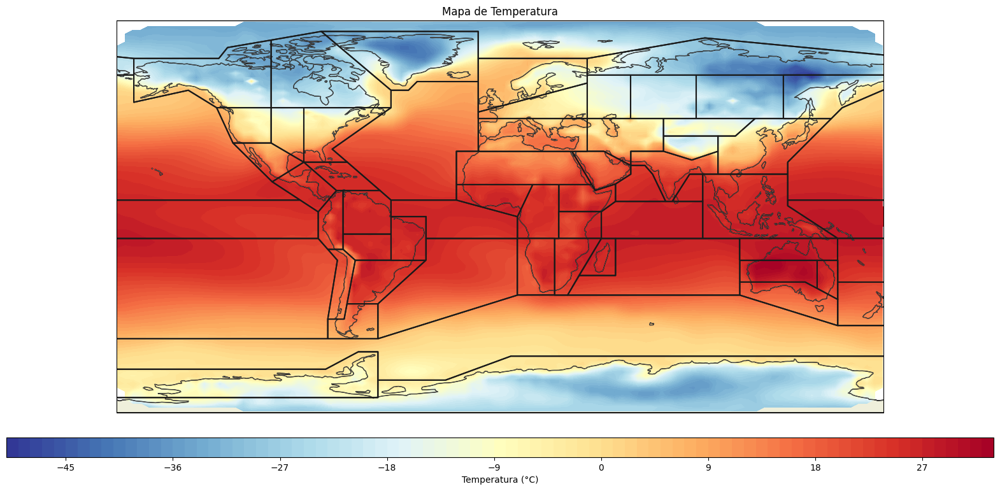

In [9]:

# Definir los límites de la malla sobre la que se interpolan los datos
grid_lon = np.linspace(ds['longitude'].min(), ds['longitude'].max(), 100)
grid_lat = np.linspace(ds['latitude'].min(), ds['latitude'].max(), 100)

# Crear malla de coordenadas
lon, lat = np.meshgrid(grid_lon, grid_lat)

# Interpolar los datos de temperatura sobre la malla
grid_temp = griddata((ds['longitude'], ds['latitude']), climatology[0], (lon, lat), method='cubic')

# Crear figura y eje con proyección de Cartopy
fig, ax = plt.subplots(figsize=(20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_extent([ds['longitude'].min() - 5, ds['longitude'].max() + 5, ds['latitude'].min() - 5, ds['latitude'].max() + 5], crs=ccrs.PlateCarree())

# Añadir características del mapa
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.add_feature(cfeature.COASTLINE)
ar6_all.plot(ax=ax, add_label=False)
# Visualizar la malla de temperatura
contour = ax.contourf(lon, lat, grid_temp, levels=100, cmap='RdYlBu_r', transform=ccrs.PlateCarree())

# Añadir barra de color
cbar = plt.colorbar(contour, ax=ax, orientation='horizontal', pad=0.05, aspect=50)
cbar.set_label('Temperatura (°C)')

# Añadir título
ax.set_title('Mapa de Temperatura')

plt.show()


In [10]:

land_mask_values = ds['land_mask'].values
# Intentar nuevamente analizar el 'land_mask'
unique_land_mask_values = np.unique(land_mask_values)
unique_land_mask_values

# Usar el valor entero (parte entera) de los tiempos flotantes como aproximación a "año"
# Esto asume que el año está representado directamente como un número flotante
dates = np.floor(ds['time'])

# Agrupar por estos años aproximados y calcular la media de la temperatura
temp = ds['temperature'].groupby(years_approx).mean('time')


# Separar las temperaturas en tierra y mar basándose en el 'land_mask'
# Considerar cualquier valor de 'land_mask' > 0 como tierra
is_land = land_mask_values > 0

# Temperaturas donde es tierra
temperature_land = ds['temperature'].where(is_land)

# Temperaturas donde es mar (negación de is_land)
temperature_sea = ds['temperature'].where(~is_land)

# Calcular la temperatura media anual para tierra y mar
annual_mean_temperature_land = temperature_land.groupby(dates).mean(dim=['time', 'map_points'])
annual_mean_temperature_sea = temperature_sea.groupby(dates).mean(dim=['time', 'map_points'])
# Calcular la desviación anual para tierra y mar
annual_std_temperature_land = temperature_land.groupby(dates).std(dim=['time', 'map_points'])
annual_std_temperature_sea = temperature_sea.groupby(dates).std(dim=['time', 'map_points'])
# Calcular la var anual para tierra y mar
annual_var_temperature_land = temperature_land.groupby(dates).var(dim=['time', 'map_points'])
annual_var_temperature_sea = temperature_sea.groupby(dates).var(dim=['time', 'map_points'])
annual_mean_temperature_land, annual_mean_temperature_sea


(<xarray.DataArray 'temperature' (time: 175)> Size: 700B
 array([-0.6116513 , -0.39715376, -0.47131598, -0.46754357, -0.34948713,
        -0.4413031 , -0.47487193, -0.7085741 , -0.42646918, -0.22443046,
        -0.56777054, -0.64176524, -0.9526564 , -0.35228318, -0.54712564,
        -0.35908064, -0.30264416, -0.19803175, -0.3843545 , -0.17906176,
        -0.3883681 , -0.4960546 , -0.3950557 , -0.2930972 , -0.19983791,
        -0.5749346 , -0.4199104 , -0.03559515,  0.28798628, -0.32406768,
        -0.4399538 , -0.23830725, -0.3737743 , -0.46876946, -0.66265595,
        -0.5442405 , -0.52421963, -0.5807033 , -0.38082722, -0.17662732,
        -0.52965444, -0.46818283, -0.45980513, -0.44748312, -0.35957053,
        -0.337237  , -0.28654888, -0.18221706, -0.36105296, -0.1542841 ,
        -0.00983609, -0.0572198 , -0.31903154, -0.3496894 , -0.47634688,
        -0.332733  , -0.1995229 , -0.5578545 , -0.39380157, -0.39708263,
        -0.37141582, -0.41177544, -0.41592464, -0.3353899 , -0.0640

In [11]:
import plotly.graph_objects as go
import numpy as np
temperature_mean = temperature_pivot_df.mean(axis=1)
# Calcular la media móvil de 12 años y la desviación estándar móvil
moving_average = temperature_mean.rolling(window=12).mean()
moving_std = temperature_mean.std()

# Calcular el intervalo de confianza del 95% para la media móvil
confidence_interval_upper = moving_average + 1.96 * moving_std / np.sqrt(12)
confidence_interval_lower = moving_average - 1.96 * moving_std / np.sqrt(12)

# Crear la gráfica base con la temperatura media
fig = go.Figure()

# Añadir la media móvil de 12 años
fig.add_trace(go.Scatter(x=temperature_mean.index, y=moving_average, mode='lines', name='Media Móvil 12 Años'))

# Añadir el intervalo de confianza como una región sombreada
fig.add_trace(go.Scatter(x=temperature_mean.index.tolist() + temperature_mean.index.tolist()[::-1],
                         y=confidence_interval_upper.tolist() + confidence_interval_lower.tolist()[::-1],
                         fill='toself', fillcolor='rgba(0,100,80,0.2)',
                         line=dict(color='rgba(255,255,255,0)'),
                         name='Intervalo de Confianza 95%'))

# Añadir la serie de temperatura promedio original para referencia
fig.add_trace(go.Scatter(x=temperature_mean.index, y=temperature_mean, mode='lines', name='Temperatura Promedio', line=dict(color='gray', dash='dash')))

# Actualizar el layout de la gráfica
fig.update_layout(title='Temperatura Promedio y Media Móvil de 12 Años con Intervalo de Confianza',
                  xaxis_title='Tiempo', yaxis_title='Temperatura Promedio (°C)',
                  legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))

# Mostrar la gráfica
fig.show()


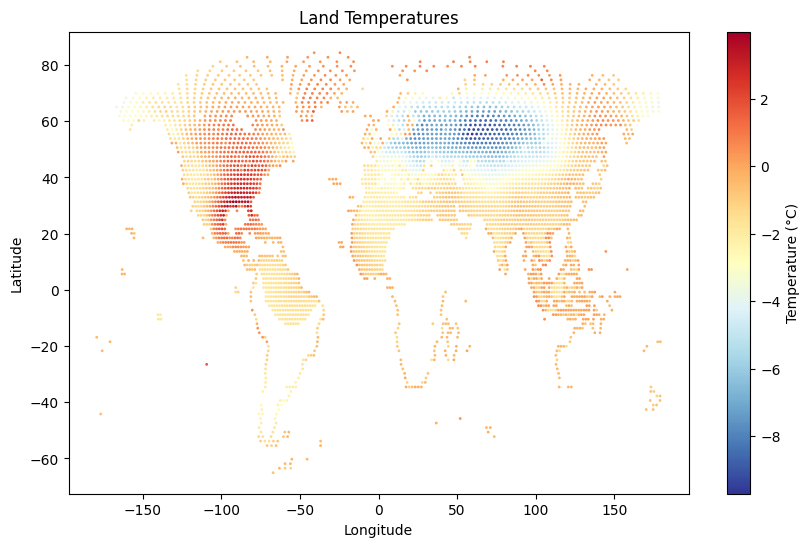

In [12]:
# Aplicar la máscara de tierra a los datos de temperatura
# Considerar cualquier valor de 'land_mask' > 0 como tierra
is_land = ds['land_mask'] > 0
temperature_land_only = ds['temperature'].isel(time=0).where(is_land, drop=True)

# Preparar los datos de latitud y longitud para el plot
longitude = ds['longitude'].values[is_land]
latitude = ds['latitude'].values[is_land]
temperature_values = temperature_land_only.values

# Crear el mapa usando scatter para mostrar solo las temperaturas de la tierra


plt.figure(figsize=(10, 6))
plt.scatter(longitude, latitude, c=temperature_values, s=1, cmap='RdYlBu_r')
plt.colorbar(label='Temperature (°C)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Land Temperatures')
plt.show()


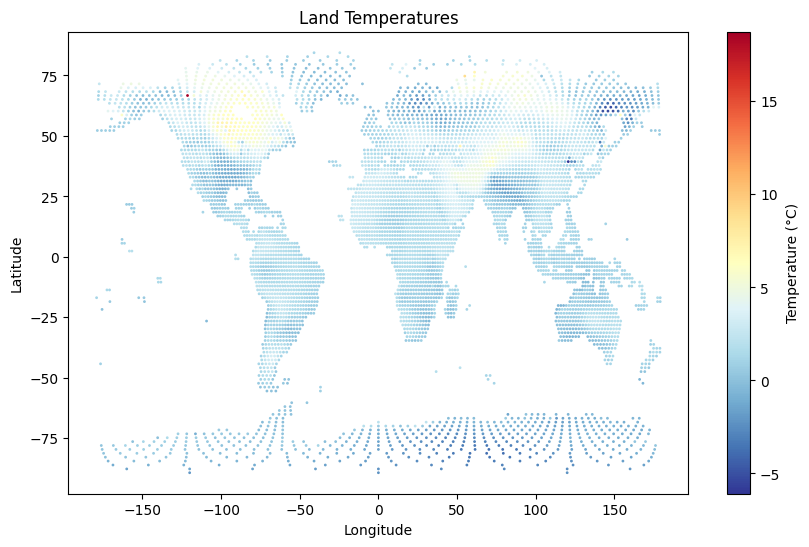

In [13]:
# Aplicar la máscara de tierra a los datos de temperatura
# Considerar cualquier valor de 'land_mask' > 0 como tierra
is_land = ds['land_mask'] > 0
temperature_land_only = ds['temperature'].isel(time=-1).where(is_land, drop=True)

# Preparar los datos de latitud y longitud para el plot
longitude = ds['longitude'].values[is_land]
latitude = ds['latitude'].values[is_land]
temperature_values = temperature_land_only.values

# Crear el mapa usando scatter para mostrar solo las temperaturas de la tierra


plt.figure(figsize=(10, 6))
plt.scatter(longitude, latitude, c=temperature_values, s=1, cmap='RdYlBu_r')
plt.colorbar(label='Temperature (°C)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Land Temperatures')
plt.show()

In [14]:

# Suponemos que 'ds' es tu xarray.Dataset con datos de temperatura, y que tiene
# variables de 'latitude' y 'longitude' correctamente definidas.

# Define las regiones AR6 utilizando regionmask
regions_ar6 = regionmask.defined_regions.ar6.all

# Crear la máscara para todas las regiones en tus datos
mask = regions_ar6.mask(ds, lon_name='longitude', lat_name='latitude')

# Inicializa un diccionario para almacenar los DataArrays filtrados por región
regions_temperature = {}

for region_id in regions_ar6.numbers:
    # Filtra los datos para la región actual usando la máscara
    regions_temperature[region_id] = ds.where(mask == region_id)

# A este punto, `regions_temperature` contiene un DataArray para cada región, donde
# cada DataArray solo incluye los datos de temperatura para esa región específica.



C:\Users\danie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\regionmask\core\mask.py:179: FutureWarning:

Passing 'lon_name' and 'lat_name' was deprecated in v0.10.0. Please pass the coordinates directly, e.g., `mask*(ds[lon_name], ds[lat_name])`.



In [15]:


# Inicializa una lista para almacenar las series de pandas
region_series_list = []

# Recorre el diccionario de regiones para construir las series
for region_id, region_ds in regions_temperature.items():
    # Asume que 'temperature' es la variable de interés y que ya hemos calculado el promedio a lo largo del tiempo
    # Aquí, tomamos el promedio a lo largo de todas las dimensiones excepto 'time', lo que debería darte una serie temporal de temperatura promedio
    temp_series = region_ds['temperature'].mean(dim=["map_points"]).to_series()
    temp_series.name = f"Region {region_id}"
    region_series_list.append(temp_series)

# Construir un DataFrame de pandas a partir de las series
temperature_df = pd.concat(region_series_list, axis=1)
temperature_df

,Region 0,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,...,Region 48,Region 49,Region 50,Region 51,Region 52,Region 53,Region 54,Region 55,Region 56,Region 57
time,,,,,,,,,,,,,,,,,,,,,
1850.041667,0.136235,-1.330789,0.008371,-1.081719,1.557231,1.357871,0.177940,0.005466,-0.013133,-0.725280,...,-0.754152,0.052812,-0.122649,-0.443389,-0.459247,-0.106958,-0.059162,-0.013802,-0.037105,-0.228845
1850.125000,-2.766186,0.903566,0.457267,-1.672187,-0.238511,0.841829,-0.398261,0.037664,-0.005968,-0.345103,...,-0.929530,0.314541,-0.209424,-0.341581,-1.092278,-0.146366,0.671129,0.367911,0.032516,-0.330520
1850.208333,-0.290138,-1.243747,-0.128986,-2.131074,-1.220055,-0.509307,-0.421122,0.153145,-0.047957,-0.186628,...,-0.766979,-0.177736,-0.228850,-0.490354,-0.456664,-0.462185,-0.215787,-0.304528,-0.054666,0.138855
1850.291667,0.248451,-1.428141,-1.840282,-0.240155,-3.188819,-1.529099,-0.744390,-0.017132,-0.094589,-0.157292,...,-0.403917,-0.471322,-0.146334,-0.470825,-0.542606,-0.543796,-0.349228,-0.271987,-0.158646,0.081552
1850.375000,0.256227,-1.246235,-1.437419,-0.391208,-1.781213,-1.727687,-1.144015,0.459868,0.275922,-0.132240,...,0.048388,-0.553649,0.094990,-0.382022,-0.085905,-0.260265,-0.337365,-0.180721,-0.149693,-0.609608
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023.708333,1.005331,2.255795,3.185757,1.018099,2.766294,1.684024,1.990303,1.745924,1.494877,2.334448,...,1.752611,0.615157,1.547976,1.210686,0.576096,1.606667,0.921754,0.997689,0.984593,1.339261
2023.791667,1.260326,2.812672,3.510752,0.684375,0.704209,1.683892,1.204790,1.629442,1.482417,2.075974,...,1.739933,0.502638,1.298851,1.106010,0.515800,1.388353,0.709824,1.006039,1.048026,0.771120
2023.875000,2.143032,4.684096,3.500223,1.464903,1.737410,0.498751,1.100038,1.298444,1.168420,1.815787,...,1.900282,0.466283,1.158728,1.270223,0.864033,1.291394,1.375861,0.970561,1.037625,0.860709


Vemos una serie de tiempo de la temperatura para ada región del planeta

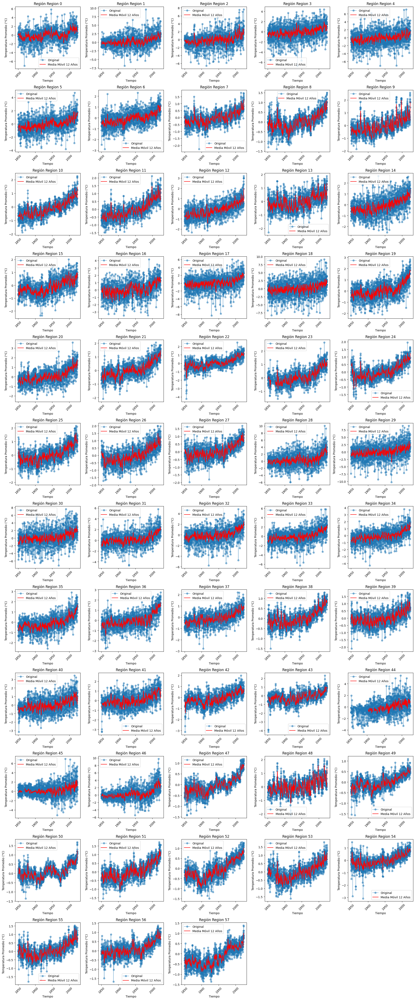

In [16]:


# Número de gráficas por fila
plots_per_row = 5

# Calcular el número total de filas necesarias
num_regions = len(temperature_df.columns)
total_rows = math.ceil(num_regions / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 4))  # Ajusta el tamaño de la figura según necesites

for i, column in enumerate(temperature_df.columns, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    
    # Plotear la serie de tiempo original
    ax.plot(temperature_df.index, temperature_df[column], label='Original', marker='o', linestyle='-', alpha=0.5)
    
    # Calcular y plotear la media móvil de 12 años
    moving_average = temperature_df[column].rolling(window=12).mean()
    ax.plot(temperature_df.index, moving_average, label='Media Móvil 12 Años', color='red', linestyle='-')
    
    # Configurar título, leyendas y ejes para cada subgráfico
    ax.set_title(f'Región {column}')
    ax.set_xlabel('Tiempo')
    ax.set_ylabel('Temperatura Promedio (°C)')
    ax.legend()
    plt.xticks(rotation=45)

# Ajustar el layout para asegurar que no haya superposición de gráficos
plt.tight_layout()
plt.show()


Vemos la matrix de correlación de cada región con las otras regiones

In [17]:
# Calcular la matriz de correlación
correlation_matrix = temperature_df.corr()

# Mostrar la matriz de correlación
print(correlation_matrix)


           Region 0  Region 1  Region 2  Region 3  Region 4  Region 5  \
Region 0   1.000000  0.200496  0.434915  0.119481  0.028209  0.104348   
Region 1   0.200496  1.000000  0.471915  0.305641  0.188649  0.112081   
Region 2   0.434915  0.471915  1.000000  0.231459  0.282742  0.353853   
Region 3   0.119481  0.305641  0.231459  1.000000  0.508902  0.075443   
Region 4   0.028209  0.188649  0.282742  0.508902  1.000000  0.679766   
Region 5   0.104348  0.112081  0.353853  0.075443  0.679766  1.000000   
Region 6   0.195643  0.123807  0.113329  0.423878  0.474510  0.368556   
Region 7   0.289500  0.309300  0.272438  0.113104  0.168344  0.382277   
Region 8   0.309361  0.365902  0.308238  0.238405  0.181782  0.345654   
Region 9   0.258625  0.390844  0.330871  0.251326  0.181295  0.296009   
Region 10  0.358479  0.425133  0.462907  0.365997  0.283362  0.399193   
Region 11  0.311135  0.382298  0.384492  0.307086  0.309395  0.451181   
Region 12  0.260786  0.339468  0.319681  0.301102  

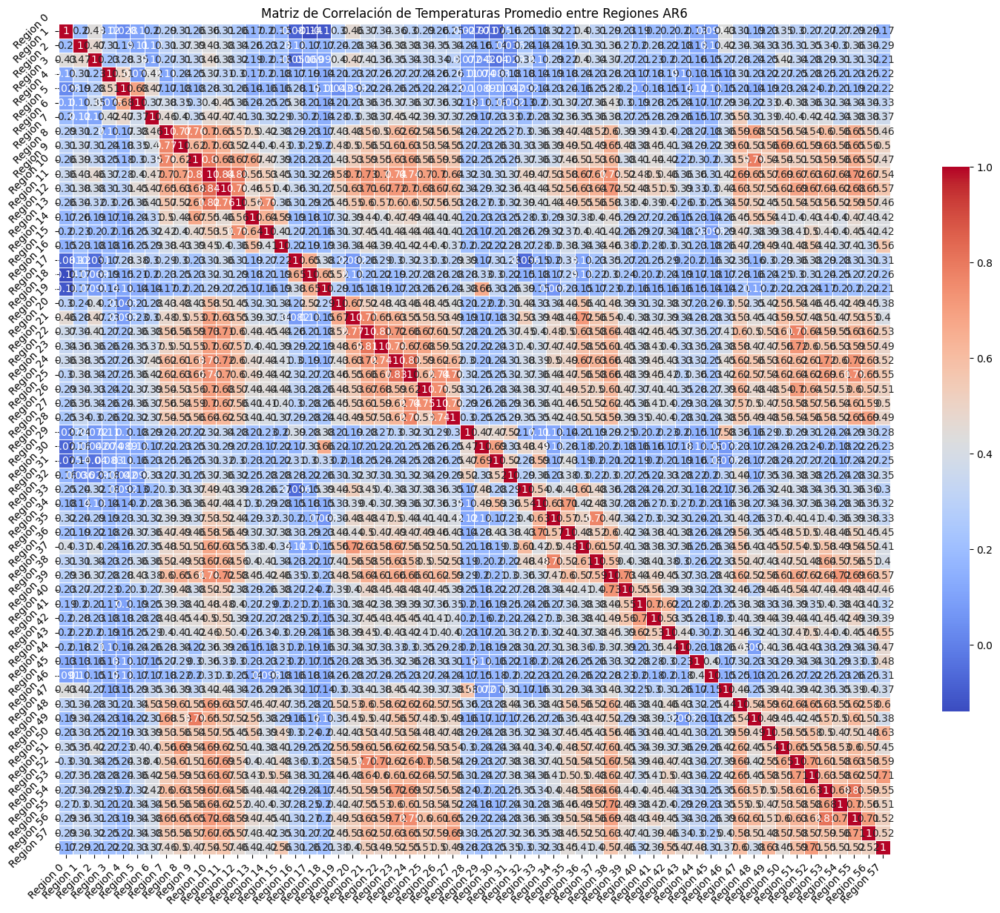

In [18]:


# Asegúrate de que la matriz de correlación ya ha sido calculada y está almacenada en `correlation_matrix`

# Usar seaborn para crear un heatmap de la matriz de correlación
plt.figure(figsize=(15, 15))
sns.heatmap(correlation_matrix, annot=True,  cmap='coolwarm', square=True,
            cbar_kws={'shrink': .5}, linewidths=.5)  
plt.title('Matriz de Correlación de Temperaturas Promedio entre Regiones AR6')
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=45)
plt.tight_layout()  # Ajusta la disposición
plt.show()


vamos a utilizar DMD para descomponer los datos en distintas frecuencias

C:\Users\danie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pydmd\bopdmd.py:751: UserWarning:

Initial trial of Optimized DMD failed to converge. Consider re-adjusting your variable projection parameters with the varpro_opts_dict and consider setting verbose=True.



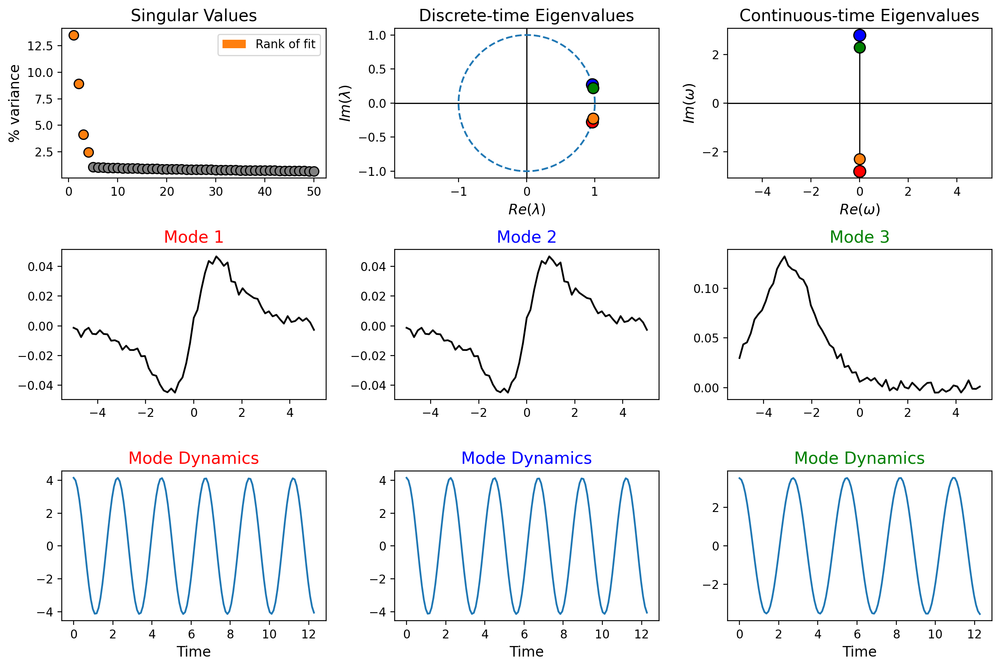

Frequencies (imaginary component): [-0.   +2.801j -0.   -2.801j  0.001+2.297j  0.001-2.297j]


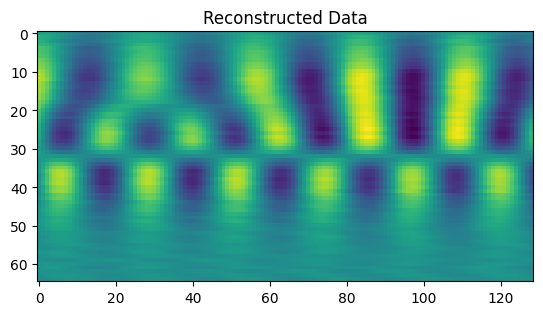

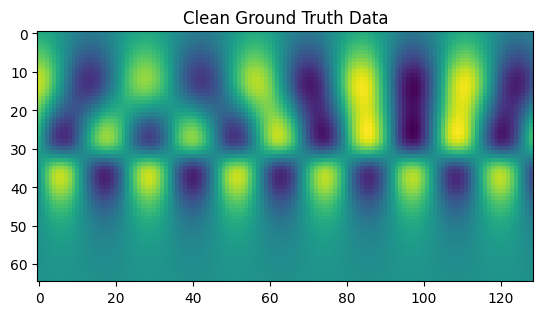

In [56]:

# Build the Optimized DMD model.
def f1(x, t):
    return 1.0 / np.cosh(x + 3) * np.cos(2.3 * t)


def f2(x, t):
    return 2.0 / np.cosh(x) * np.tanh(x) * np.sin(2.8 * t)


nx = 65  # number of grid points along space dimension
nt = 129  # number of grid points along time dimension
d=4
# Define the space and time grid for data collection.
x = np.linspace(-5, 5, nx)
t = np.linspace(0, 4 * np.pi, nt)
xgrid, tgrid = np.meshgrid(x, t)
dt = t[1] - t[0]  # time step between each snapshot

# Data consists of 2 spatiotemporal signals.
X1 = f1(xgrid, tgrid)
X2 = f2(xgrid, tgrid)
X = X1 + X2

# Make a version of the data with noise.
mean = 0
std_dev = 0.2
random_matrix = np.random.normal(mean, std_dev, size=(nt, nx))
Xn = X + random_matrix

X.shape# num_trials=0 gives Optimized DMD, without bagging.
optdmd = BOPDMD(svd_rank=4, num_trials=0)

# Wrap the model with the preprocessing routine.
delay_optdmd = hankel_preprocessing(optdmd, d=d)

# Fit the model to the noisy data.
# Note: BOPDMD models need the data X and the times of data collection t for fitting.
# Hence if we apply time-delay, we must adjust the length of our time vector accordingly.
delay_t = t[: -d + 1]
delay_optdmd.fit(Xn.T, t=delay_t)

# Plot a summary of the DMD results.
plot_summary(delay_optdmd, x=x, d=d)

# Print computed eigenvalues (frequencies are given by imaginary components).
# Also plot the resulting data reconstruction.
print(
    f"Frequencies (imaginary component): {np.round(delay_optdmd.eigs, decimals=3)}"
)
plt.title("Reconstructed Data")
plt.imshow(delay_optdmd.reconstructed_data.real)
plt.show()
plt.title("Clean Ground Truth Data")
plt.imshow(X.T)
plt.show()

In [35]:
temperature_df_clean = temperature_df.fillna(method='ffill').fillna(method='bfill')
X = temperature_df_clean.iloc[:, :-1].values
X_prime = temperature_df_clean.iloc[:, 1:].values

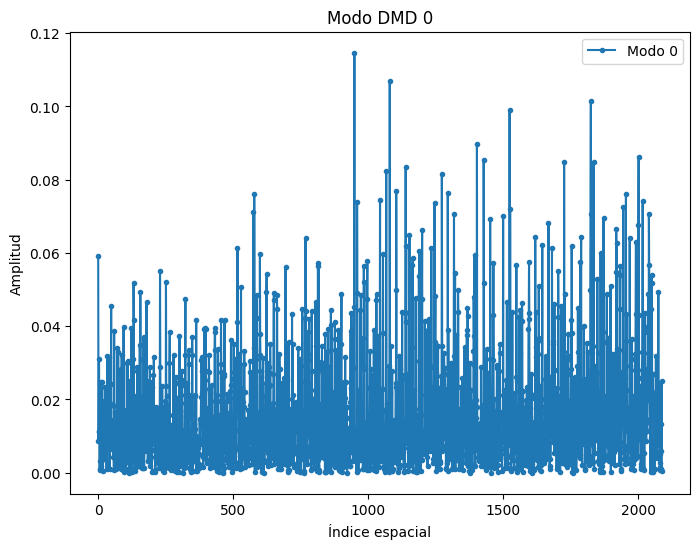

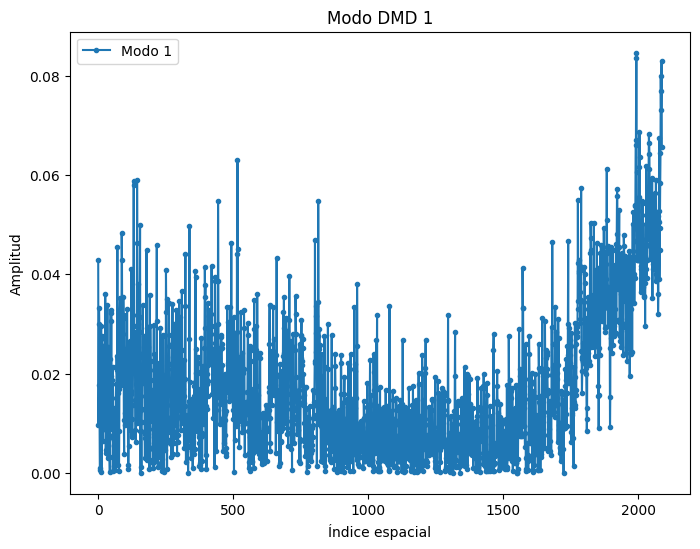

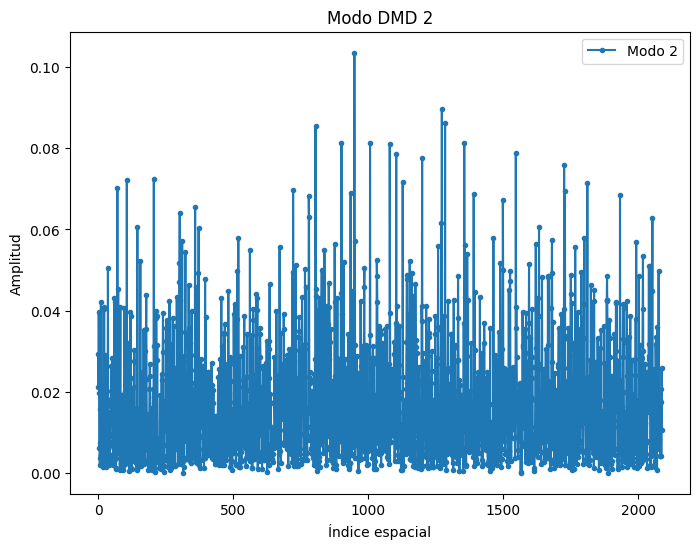

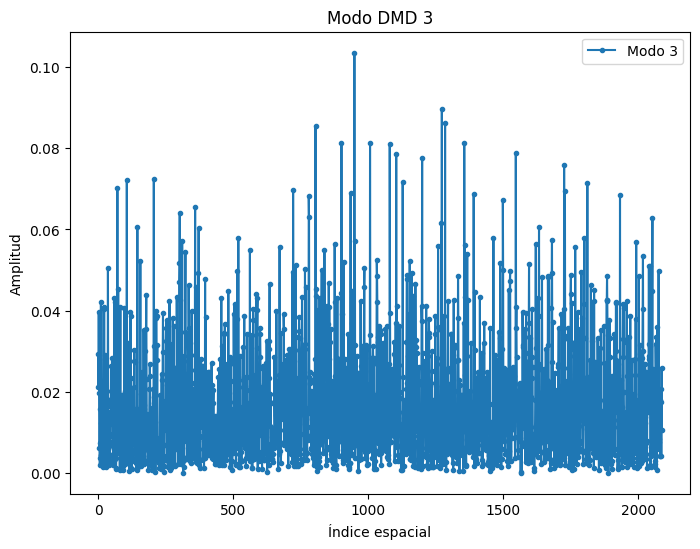

In [47]:
from pydmd import DMD
import numpy as np
import matplotlib.pyplot as plt

# Supongamos que temperature_df es tu DataFrame y ya está cargado
# Convertimos el DataFrame a la matriz necesaria para PyDMD
data_matrix = temperature_df_clean.values

# Dado que PyDMD trabaja con matrices donde cada columna es una instantánea en el tiempo,
# y las filas son las características/observaciones espaciales a lo largo del tiempo,
# asegúrate de que tu data_matrix esté organizada de esta manera.

# Inicializar y ajustar el modelo DMD
dmd = DMD(svd_rank=5)  # Puedes ajustar svd_rank según sea necesario
dmd.fit(data_matrix)

# Plotear los modos DMD
for i, mode in enumerate(dmd.modes.T):
    plt.figure(figsize=(8, 6))
    plt.plot(np.abs(mode), '.-', label=f'Modo {i}')
    plt.title(f'Modo DMD {i}')
    plt.xlabel('Índice espacial')
    plt.ylabel('Amplitud')
    plt.legend()
    plt.show()


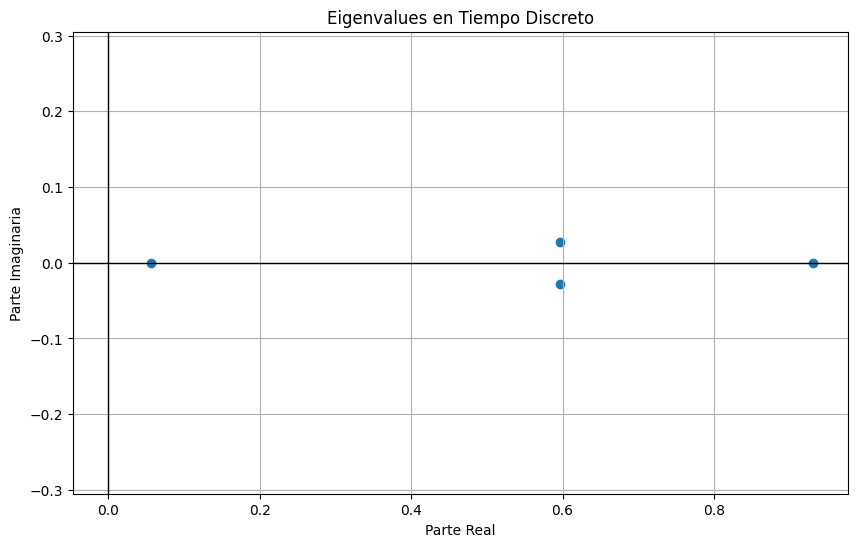

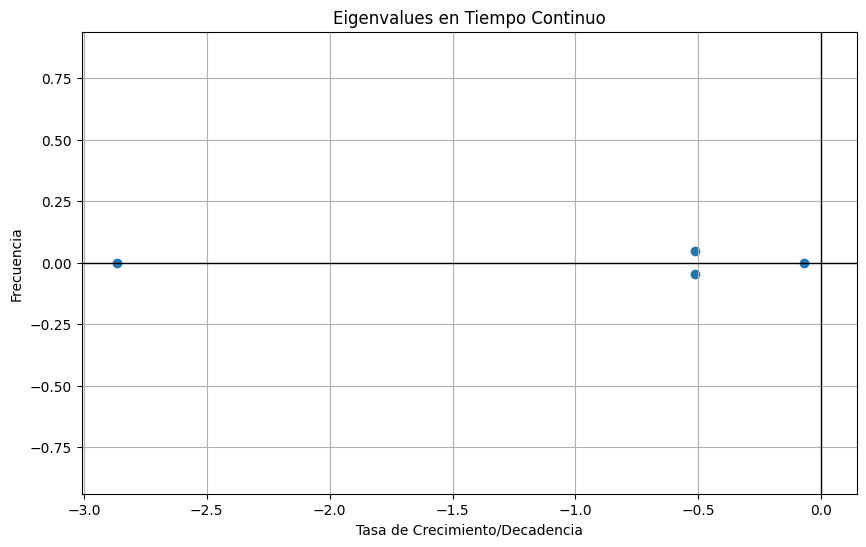

In [49]:
import numpy as np
import matplotlib.pyplot as plt
from pydmd import DMD

# Suponiendo que dmd es tu objeto DMD ya ajustado


# Plotear los eigenvalues en tiempo discreto
plt.figure(figsize=(10, 6))
plt.scatter(dmd.eigs.real, dmd.eigs.imag, marker='o')
plt.title('Eigenvalues en Tiempo Discreto')
plt.xlabel('Parte Real')
plt.ylabel('Parte Imaginaria')
plt.axhline(0, color='black', lw=1)
plt.axvline(0, color='black', lw=1)
plt.grid(True)
plt.axis('equal')
plt.show()

# Calcular y plotear los eigenvalues en tiempo continuo
eigs_cont = np.log(dmd.eigs) / dmd.original_time['dt']

plt.figure(figsize=(10, 6))
plt.scatter(eigs_cont.real, eigs_cont.imag, marker='o')
plt.title('Eigenvalues en Tiempo Continuo')
plt.xlabel('Tasa de Crecimiento/Decadencia')
plt.ylabel('Frecuencia')
plt.axhline(0, color='black', lw=1)
plt.axvline(0, color='black', lw=1)
plt.grid(True)
plt.axis('equal')
plt.show()


In [39]:
# Paso 1: Descomposición en Valores Singulares (SVD) de X
U, Sigma, Vh = np.linalg.svd(X, full_matrices=False)

# Determinar el número de modos (puedes ajustar esto según sea necesario)
r = min(len(Sigma), 3)  # Por ejemplo, limitar a los primeros 10 modos para un ejemplo simplificado
U_r = U[:, :r]
Sigma_r_inv = np.diag(1.0 / Sigma[:r])
Vh_r = Vh[:r, :]

# Paso 2: Construcción de la matriz A tilde
A_tilde = U_r.T @ X_prime @ Vh_r.T @ Sigma_r_inv

# Paso 3: Calculamos los valores y vectores propios de A tilde
eigvals, W = np.linalg.eig(A_tilde)

# Paso 4: Calculamos los modos de DMD
Phi = X_prime @ Vh_r.T @ Sigma_r_inv @ W

# Paso 5: Calculamos las amplitudes de los modos
b = np.linalg.pinv(Phi) @ X[:, 0]


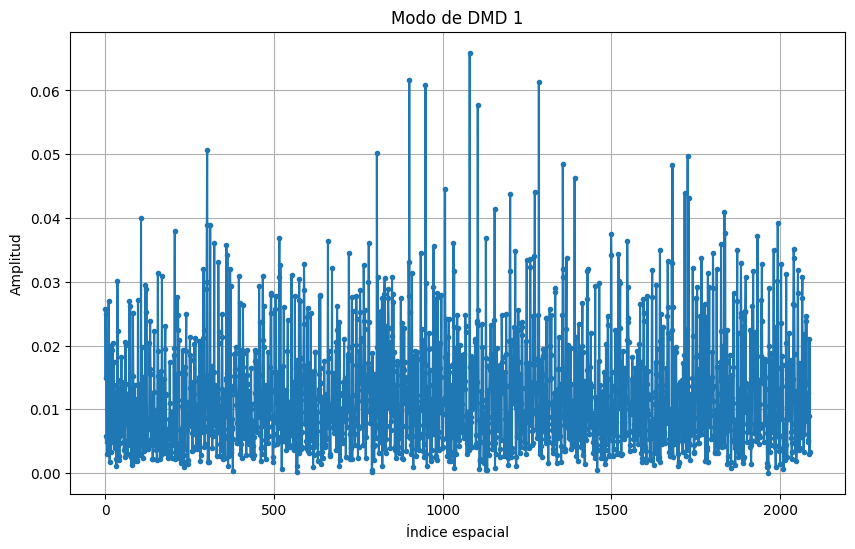

In [43]:
# Visualización del primer modo de DMD
modo_a_plotear = 1 # Cambia esto para visualizar diferentes modos

plt.figure(figsize=(10, 6))
plt.plot(np.abs(Phi[:, modo_a_plotear]), '.-')  # Usamos valor absoluto para simplificar
plt.title(f'Modo de DMD {modo_a_plotear}')
plt.xlabel('Índice espacial')
plt.ylabel('Amplitud')
plt.grid(True)
plt.show()


C:\Users\danie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pydmd\snapshots.py:73: UserWarning:

Input data condition number 61111264.0. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.

C:\Users\danie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pydmd\bopdmd.py:751: UserWarning:

Initial trial of Optimized DMD failed to converge. Consider re-adjusting your variable projection parameters with the varpro_opts_dict and consider setting verbose=True.



Frequencies (imaginary component): [-0.045+0.579j -0.045-0.579j -0.039+0.205j -0.039-0.205j]


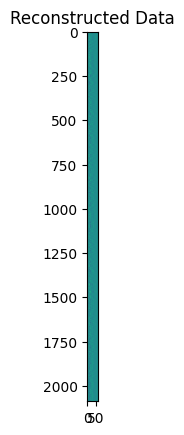

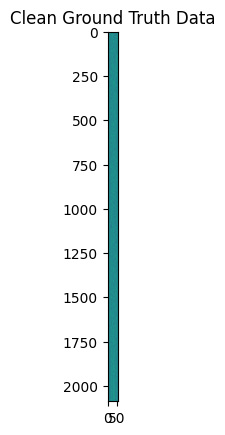

In [52]:

# Asegurarse de que no haya NaNs
temperature_df_clean = temperature_df.fillna(method='ffill').fillna(method='bfill')

# Convertir a numpy y transponer
data_matrix = temperature_df_clean.values.T

# Escalar los datos (opcional)

scaler = StandardScaler()
data_matrix_scaled = scaler.fit_transform(data_matrix)

# Aplicar DMD con un svd_rank ajustado
dmd = DMD(svd_rank=6)  # Ejemplo: Usar los 2 valores singulares principales
dmd.fit(data_matrix_scaled)
# Paso 3: Analizar los resultados
# Obtener modos dinámicos y valores propios (frecuencias)
modes = dmd.modes
eigenvalues = dmd.eigs
#plot_summary(dmd, x=x, t=dt, d=d)
# Intentar nuevamente visualizar los resultados
scaler = StandardScaler()

# Build the Optimized DMD model.
# num_trials=0 gives Optimized DMD, without bagging.
optdmd = BOPDMD(svd_rank=4, num_trials=0)
d = 2
t = np.arange(len(data_matrix_scaled))
# Asegurarse de que los datos también se ajusten a la nueva longitud del vector de tiempo
# Necesitamos "cortar" los datos para que coincidan con la longitud de 'delay_t'
# Esto se hace cortando las últimas 'd-1' columnas de 'data_matrix_scaled'
adjusted_data_matrix = data_matrix_scaled[:, :(len(data_matrix_scaled.T) - d + 1)]
# Wrap the model with the preprocessing routine.

delay_optdmd = hankel_preprocessing(optdmd, d=d)

# Fit the model to the noisy data.
# Note: BOPDMD models need the data X and the times of data collection t for fitting.
# Hence if we apply time-delay, we must adjust the length of our time vector accordingly.
delay_t = t[: -d + 1]
delay_optdmd.fit(adjusted_data_matrix.T, t=delay_t)
# Plot a summary of the DMD results.
#plot_summary(delay_optdmd, x=adjusted_data_matrix, d=d)

# Print computed eigenvalues (frequencies are given by imaginary components).
# Also plot the resulting data reconstruction.
print(
    f"Frequencies (imaginary component): {np.round(delay_optdmd.eigs, decimals=3)}"
)
plt.title("Reconstructed Data")
plt.imshow(delay_optdmd.reconstructed_data.real)
plt.show()

plt.title("Clean Ground Truth Data")
plt.imshow(adjusted_data_matrix.T)
plt.show()

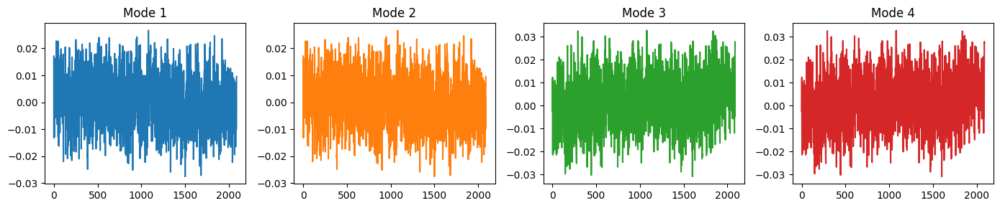

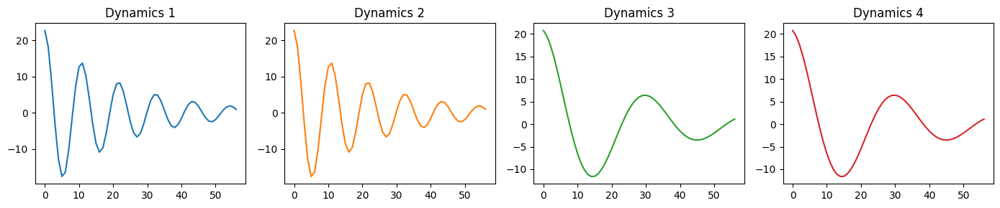

C:\Users\danie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pydmd\plotter.py:202: UserWarning:

Legend does not support handles for list instances.
A proxy artist may be used instead.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#controlling-the-legend-entries



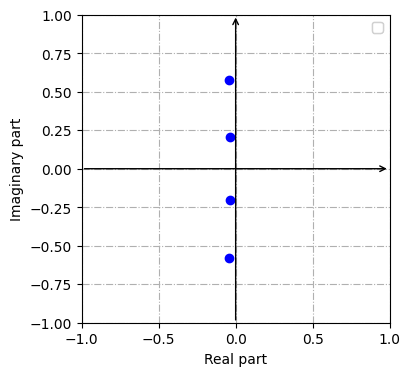

Computed amplitudes: [22.7   22.7   20.747 20.747]



In [53]:
colors = ["tab:blue", "tab:orange", "tab:green", "tab:red"]

# Plotting the modes individually...
plt.figure(figsize=(14, 3))
for i, mode in enumerate(delay_optdmd.modes.T):
    # Get the average across delays, since we used time-delay.
    mode = np.average(mode.reshape(d, len(mode) // d), axis=0)
    plt.subplot(1, len(delay_optdmd.modes.T), i + 1)
    plt.plot(mode.real, c=colors[i])
    plt.title(f"Mode {i + 1}")
plt.tight_layout()
plt.show()

# Plotting the dynamics individually...
plt.figure(figsize=(14, 3))
for i, dynamic in enumerate(delay_optdmd.dynamics):
    plt.subplot(1, len(delay_optdmd.dynamics), i + 1)
    plt.plot(delay_t, dynamic.real, c=colors[i])
    plt.title(f"Dynamics {i + 1}")
plt.tight_layout()
plt.show()

# Plot the eigenvalues.
plot_eigs(delay_optdmd, show_axes=True, show_unit_circle=False, figsize=(4, 4))

# Print the amplitudes.
print(f"Computed amplitudes: {np.round(delay_optdmd.amplitudes, decimals=3)}\n")

In [55]:

# Asegurarse de que no haya NaNs
temperature_df_clean2 = temperature_pivot_df.fillna(method='ffill').fillna(method='bfill')

# Convertir a numpy y transponer
data_matrix2 = temperature_df_clean2.values.T

# Escalar los datos (opcional)
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
data_matrix_scaled2 = scaler.fit_transform(data_matrix2)
d = 2
t = np.arange(len(data_matrix_scaled2))
# Build the Optimized DMD model.
# num_trials=0 gives Optimized DMD, without bagging.
optdmd = BOPDMD(svd_rank=4, num_trials=0)

# Wrap the model with the preprocessing routine.
delay_optdmd = hankel_preprocessing(optdmd, d=d)

# Fit the model to the noisy data.
# Note: BOPDMD models need the data X and the times of data collection t for fitting.
# Hence if we apply time-delay, we must adjust the length of our time vector accordingly.
delay_t = t[: -d + 1]
delay_optdmd.fit(data_matrix_scaled2.T, t=delay_t)

# Plot a summary of the DMD results.
plot_summary(delay_optdmd, x=data_matrix_scaled2, d=d)

# Print computed eigenvalues (frequencies are given by imaginary components).
# Also plot the resulting data reconstruction.
print(
    f"Frequencies (imaginary component): {np.round(delay_optdmd.eigs, decimals=3)}"
)
plt.title("Reconstructed Data")
plt.imshow(delay_optdmd.reconstructed_data.real)
plt.show()
plt.title("Clean Ground Truth Data")
plt.imshow(X.T)
plt.show()


KeyboardInterrupt: 

In [ ]:
temperature_df_clean2

,point_1,point_2,point_3,point_4,point_5,point_6,point_7,point_8,point_9,point_10,...,point_15975,point_15976,point_15977,point_15978,point_15979,point_15980,point_15981,point_15982,point_15983,point_15984
time,,,,,,,,,,,,,,,,,,,,,
1850.041667,0.271992,0.163249,0.569169,0.763016,-0.474809,0.205141,0.464756,0.681552,0.785687,-0.514720,...,-1.188128,-1.097396,-0.930260,-0.796976,-0.555554,-0.465924,-0.462967,-0.356248,-1.158579,-0.501983
1850.125000,0.271992,0.163249,0.569169,0.763016,-0.474809,0.205141,-1.490464,-1.236933,-0.806517,-0.514720,...,-1.188128,-1.097396,-0.930260,-0.796976,-0.555554,-0.465924,-0.462967,-0.356248,-1.158579,-0.501983
1850.208333,0.271992,0.163249,0.569169,0.763016,-0.474809,0.205141,-0.157294,-0.230608,-0.166150,-0.514720,...,-1.188128,-1.097396,-0.930260,-0.796976,-0.555554,-0.465924,-0.462967,-0.356248,-1.158579,-0.501983
1850.291667,0.271992,0.163249,0.569169,0.763016,-0.474809,0.205141,-0.139167,-0.058191,-0.072071,-0.514720,...,-1.188128,-1.097396,-0.930260,-0.796976,-0.555554,-0.465924,-0.462967,-0.356248,-1.158579,-0.501983
1850.375000,0.271992,0.163249,0.569169,0.763016,-0.474809,0.205141,-0.878162,-0.964869,-1.003502,-0.514720,...,-1.188128,-1.097396,-0.930260,-0.796976,-0.555554,-0.465924,-0.462967,-0.356248,-1.158579,-0.501983
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023.708333,3.572811,3.403889,3.104065,3.572134,3.947232,4.061386,3.960081,3.396507,2.925470,2.594597,...,4.873400,4.235393,3.736127,3.506160,3.736602,4.466856,5.363996,4.570330,3.837247,4.187545
2023.791667,4.615166,4.363587,4.230099,4.873150,4.859375,4.684975,4.424963,4.008696,3.911466,4.075274,...,0.053109,0.790439,1.166225,0.968318,0.405440,-0.025364,-0.410588,-0.049767,0.623732,0.115229
2023.875000,2.275177,1.895290,1.979955,2.791295,2.335094,2.158423,2.067128,1.761387,1.422559,1.556717,...,1.198588,1.420194,1.179327,0.567495,-0.081277,-0.329289,-0.243190,0.701073,0.797992,0.335104


Frequencies (imaginary component): [-0.   +0.043j -0.   -0.043j  0.002+0.012j  0.002-0.012j]


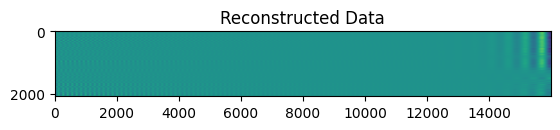

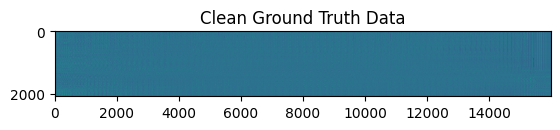

In [24]:
# Plot a summary of the DMD results.
#plot_summary(delay_optdmd, x=data_matrix_scaled2, d=d)

# Print computed eigenvalues (frequencies are given by imaginary components).
# Also plot the resulting data reconstruction.
print(
    f"Frequencies (imaginary component): {np.round(delay_optdmd.eigs, decimals=3)}"
)
plt.title("Reconstructed Data")
plt.imshow(delay_optdmd.reconstructed_data.real)
plt.show()
plt.title("Clean Ground Truth Data")
plt.imshow(data_matrix_scaled2.T)
plt.show()